In [1]:
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import nilearn.image, nilearn.signal, nilearn.plotting
import pickle

import sklearn.preprocessing

/Users/eyshin/.pyenv/versions/eyspy3.6/lib/python3.6/site-packages/pandas/compat/__init__.py:85: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)
/Users/eyshin/.pyenv/versions/eyspy3.6/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)
/Users/eyshin/.pyenv/versions/eyspy3.6/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should 

In [2]:
data_dir = '/Volumes/clmnlab/GA/fmri_data/preproc_data/'
mask_dir = '/Volumes/clmnlab/GA/fmri_data/GA_caudate_ROI/slicer_2/tlrc_resam_fullmask/'
stat_dir = '/Volumes/clmnlab/GA/fmri_data/glm_results/am_reg_SPMG2/stats/'

ga_subj_list = [
    'GA01', 'GA02', 'GA05', 'GA07', 'GA08', 'GA11', 'GA12', 'GA13', 'GA14', 'GA15',
    'GA18', 'GA19', 'GA20', 'GA21', 'GA23', 'GA26', 'GA27', 'GA28', 'GA29', 'GA30',
    'GA31', 'GA32', 'GA33', 'GA34', 'GA35', 'GA36', 'GA37', 'GA38', 'GA42', 'GA44'
]

gb_subj_list = [subj.replace('A', 'B') for subj in ga_subj_list]

subj_list = ga_subj_list + gb_subj_list

In [3]:
with open('/Volumes/clmnlab/GA/fmri_data/glm_results/am_reg_SPMG2/SPMG2_rwdtm2_trained.pkl', 'rb') as file:
    trained_rwd = pickle.load(file=file)
    
with open('/Volumes/clmnlab/GA/fmri_data/glm_results/am_reg_SPMG2/SPMG2_rwdtm2_untrained.pkl', 'rb') as file:
    untrained_rwd = pickle.load(file=file)

In [11]:
subj = 'GA01'
run = 1

pb04_img = nilearn.image.load_img(data_dir + '%s/pb04.%s.r0%d.scale.nii.gz' % (subj, subj, run))

In [13]:
stat_img = nilearn.image.load_img(stat_dir + 'statsRWDtime.%s.run0%d.SPMG2.nii' % (subj, run))

In [14]:
stat_img.shape

(72, 85, 72)

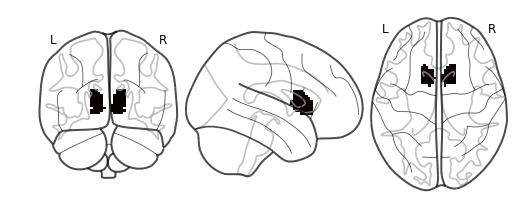

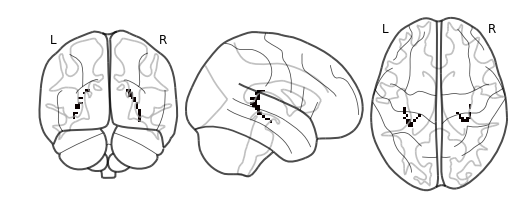

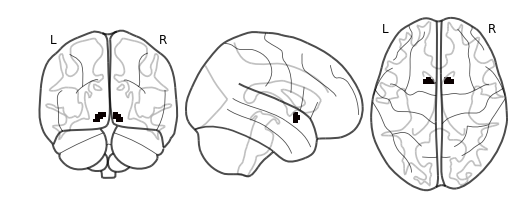

In [20]:
cdh_mask = nilearn.image.math_img(
    img1=nilearn.image.load_img(mask_dir + '%s_1_caudate_head_resam.nii' % (subj)),
    formula='img1 > 0'
)

cdt_mask = nilearn.image.math_img(
    img1=nilearn.image.load_img(mask_dir + '%s_3_caudate_tail_resam.nii' % (subj)),
    formula='img1 > 0'
)

nac_mask = nilearn.image.math_img(
    img1=nilearn.image.load_img('/Volumes/clmnlab/GA/fmri_data/masks/ReinforcemenLearning/roi_201907/03_resam_GA/bilateral/RL_03_NAC_resam.nii.gz'),
    formula='img1 > 0'
)

nilearn.plotting.plot_glass_brain(cdh_mask)
nilearn.plotting.plot_glass_brain(cdt_mask)
nilearn.plotting.plot_glass_brain(nac_mask)

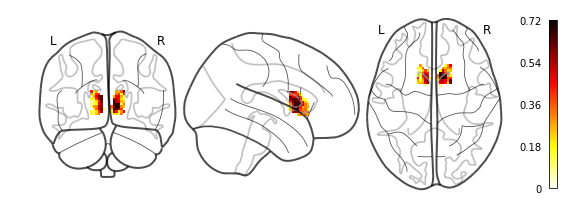

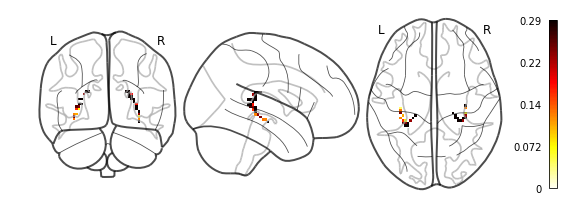

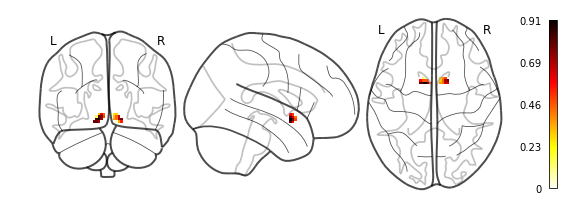

In [22]:
cdh_stat = nilearn.image.math_img(img1=stat_img, img2=cdh_mask, formula='img1 * img2')
cdt_stat = nilearn.image.math_img(img1=stat_img, img2=cdt_mask, formula='img1 * img2')
nac_stat = nilearn.image.math_img(img1=stat_img, img2=nac_mask, formula='img1 * img2')

nilearn.plotting.plot_glass_brain(cdh_stat, colorbar=True)
nilearn.plotting.plot_glass_brain(cdt_stat, colorbar=True)
nilearn.plotting.plot_glass_brain(nac_stat, colorbar=True)

In [56]:
cdh_peak = np.where(cdh_stat.get_data() == np.max(cdh_stat.get_data()))
cdt_peak = np.where(cdt_stat.get_data() == np.max(cdt_stat.get_data()))
nac_peak = np.where(nac_stat.get_data() == np.max(nac_stat.get_data()))

In [57]:
cdh_signal = pb04_img.get_data()[cdh_peak]
cdt_signal = pb04_img.get_data()[cdt_peak]
nac_signal = pb04_img.get_data()[nac_peak]

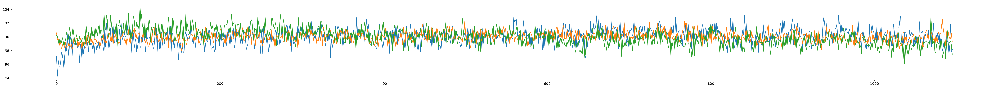

In [64]:
plt.subplots(figsize=(50, 4))

plt.plot(np.arange(1096), cdh_signal[0])
plt.plot(np.arange(1096), cdt_signal[0])
plt.plot(np.arange(1096), nac_signal[0])

In [95]:
cleaned_cdh_signal = nilearn.signal.clean(cdh_signal.T, standardize='zscore', t_r=0.46, high_pass=0.01, low_pass=0.1)
cleaned_cdt_signal = nilearn.signal.clean(cdt_signal.T, standardize='zscore', t_r=0.46, high_pass=0.01, low_pass=0.1)
cleaned_nac_signal = nilearn.signal.clean(nac_signal.T, standardize='zscore', t_r=0.46, high_pass=0.01, low_pass=0.1)

In [101]:
standardize = sklearn.preprocessing.StandardScaler()

standardized_rwd = standardize.fit_transform(np.array(trained_rwd['GA01'][:1096]).reshape(-1, 1))

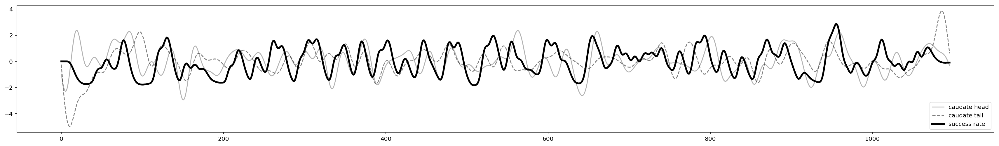

In [117]:
plt.subplots(figsize=(30, 4))

#plt.plot(np.arange(1096), cdh_signal[0])
plt.plot(np.arange(1096), cleaned_cdh_signal.T[0], 'k-', label='caudate head', alpha=0.3)
plt.plot(np.arange(1096), cleaned_cdt_signal.T[0], 'k--', label='caudate tail', alpha=0.5)
#plt.plot(np.arange(1096), cleaned_nac_signal.T[0], '-.', label='NAc')
plt.plot(np.arange(1096), standardized_rwd, 'k-', label='success rate', linewidth=3)

plt.legend()

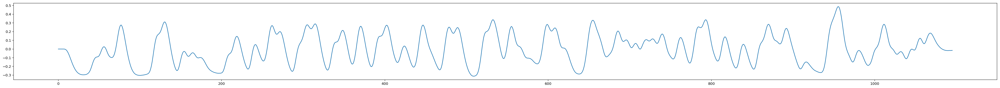

In [79]:
plt.subplots(figsize=(50, 4))

plt.plot(np.arange(1096), trained_rwd['GA01'][:1096])

In [77]:
3288/3

1096.0

In [120]:
for subj in subj_list:
    stat_img = nilearn.image.load_img(stat_dir + 'statsRWDtime.%s.run0%d.SPMG2.nii' % (subj, run))
    
    cdh_mask = nilearn.image.math_img(
        img1=nilearn.image.load_img(mask_dir + '%s_1_caudate_head_resam.nii' % (subj.replace('B', 'A'))),
        formula='img1 > 0'
    )

    cdt_mask = nilearn.image.math_img(
        img1=nilearn.image.load_img(mask_dir + '%s_3_caudate_tail_resam.nii' % (subj.replace('B', 'A'))),
        formula='img1 > 0'
    )
    
    cdh_stat = nilearn.image.math_img(img1=stat_img, img2=cdh_mask, formula='img1 * img2')
    cdt_stat = nilearn.image.math_img(img1=stat_img, img2=cdt_mask, formula='img1 * img2')
    
    print(subj)
    print(np.max(cdh_stat.get_data()), np.min(cdh_stat.get_data()))
    print(np.max(cdt_stat.get_data()), np.min(cdt_stat.get_data()))
    print()

GA01
0.72239 -0.6294975
0.28857803 -0.6987432

GA02
0.8844586 -0.45188913
0.3025429 -0.53249943

GA05
1.244003 -1.0227443
0.1303689 -0.87700313

GA07
1.0058057 -0.27253333
0.10219873 -0.34482476

GA08
0.5034002 -1.298024
0.33114472 -0.5486127

GA11
1.476252 -0.24713567
0.42202207 -0.2658538

GA12
1.174067 -0.47477254
0.11292777 -1.1365004

GA13
0.4400214 -0.5712961
0.26987273 -0.5194578

GA14
0.06153129 -1.3515062
0.2090166 -0.79869723

GA15
1.116653 -0.28464505
0.5404854 -0.6199415

GA18
0.23619848 -0.9889506
0.20317027 -0.58472145

GA19
0.86659884 -0.763535
0.52010083 -0.6594968

GA20
1.1335243 -0.16198003
0.3318538 -0.45919123

GA21
2.0161774 -0.82523096
0.59620416 -1.0401137

GA23
0.24987549 -0.94647247
0.15117908 -0.69232655

GA26
0.3847413 -0.6271928
0.20169675 -0.25578743

GA27
1.1517512 -0.33301908
0.4840316 -0.32000232

GA28
0.6609933 -0.72107536
0.45676845 -0.5487193

GA29
1.3301766 -0.42880294
0.22875792 -0.8017252

GA30
0.40123257 -0.45788616
0.0999482 -0.545552

GA31
0.418

In [4]:
def select_one_voxel(voxels):
    return voxels[0][0], voxels[1][0], voxels[2][0]

In [20]:
standardize = sklearn.preprocessing.StandardScaler()

mapping_name = ['Trained', 'Untrained']

#results = {}

for i, subj in enumerate(subj_list):
    if (subj, 'Untrained') in results:
        continue    
    
    cdh_mask = nilearn.image.math_img(
        img1=nilearn.image.load_img(mask_dir + '%s_1_caudate_head_resam.nii' % (subj.replace('B', 'A'))),
        formula='img1 > 0'
    )

    cdt_mask = nilearn.image.math_img(
        img1=nilearn.image.load_img(mask_dir + '%s_3_caudate_tail_resam.nii' % (subj.replace('B', 'A'))),
        formula='img1 > 0'
    )
    
    for mapping, runs in enumerate([[1, 2, 3], [4, 5, 6]]):
    
        cleaned_cdh_signal_max = []
        cleaned_cdh_signal_min = []
        cleaned_cdt_signal_max = []
        cleaned_cdt_signal_min = []
        
        for run in runs:
            stat_img = nilearn.image.load_img(stat_dir + 'statsRWDtime.%s.run0%d.SPMG2.nii' % (subj, run))
            
            cdh_stat = nilearn.image.math_img(img1=stat_img, img2=cdh_mask, formula='img1 * img2')
            cdt_stat = nilearn.image.math_img(img1=stat_img, img2=cdt_mask, formula='img1 * img2')

            # early + head = pos, late + head = neg
            nonzero_cdh_stat = cdh_stat.get_data()[np.nonzero(cdh_stat.get_data())]
            cdh_peak_val_min = np.min(nonzero_cdh_stat)
            cdh_peak_val_max = np.max(nonzero_cdh_stat)
            
            cdh_peak_min = select_one_voxel(np.where(cdh_stat.get_data() == cdh_peak_val_min))
            cdh_peak_max = select_one_voxel(np.where(cdh_stat.get_data() == cdh_peak_val_max))

            # early + tail = neg, late + tail = pos
            nonzero_cdt_stat = cdt_stat.get_data()[np.nonzero(cdt_stat.get_data())]
            cdt_peak_val_min = np.min(nonzero_cdt_stat)
            cdt_peak_val_max = np.max(nonzero_cdt_stat)
            
            cdt_peak_min = select_one_voxel(np.where(cdt_stat.get_data() == cdt_peak_val_min))
            cdt_peak_max = select_one_voxel(np.where(cdt_stat.get_data() == cdt_peak_val_max))

            pb04_img = nilearn.image.load_img(data_dir + '%s/pb04.%s.r0%d.scale.nii.gz' % (subj, subj, run))
            
            cdh_signal_min = pb04_img.get_data()[cdh_peak_min]
            cdh_signal_max = pb04_img.get_data()[cdh_peak_max]
            cdt_signal_min = pb04_img.get_data()[cdt_peak_min]
            cdt_signal_max = pb04_img.get_data()[cdt_peak_max]
            
            cleaned_cdh_signal_min.append(nilearn.signal.clean(cdh_signal_min.reshape(-1, 1), standardize='zscore', t_r=0.46, high_pass=0.01, low_pass=0.1))
            cleaned_cdh_signal_max.append(nilearn.signal.clean(cdh_signal_max.reshape(-1, 1), standardize='zscore', t_r=0.46, high_pass=0.01, low_pass=0.1))
            cleaned_cdt_signal_min.append(nilearn.signal.clean(cdt_signal_min.reshape(-1, 1), standardize='zscore', t_r=0.46, high_pass=0.01, low_pass=0.1))
            cleaned_cdt_signal_max.append(nilearn.signal.clean(cdt_signal_max.reshape(-1, 1), standardize='zscore', t_r=0.46, high_pass=0.01, low_pass=0.1))
            
            results[subj, mapping_name[mapping], run] = (cdh_peak_min, cdh_peak_val_min,
                                                         cdh_peak_max, cdh_peak_val_max,
                                                         cdt_peak_min, cdt_peak_val_min,
                                                         cdt_peak_max, cdt_peak_val_max)
        
        if mapping == 0: # trained
            standardized_rwd = standardize.fit_transform(np.array(trained_rwd[subj]).reshape(-1, 1))
        else: # untrained
            standardized_rwd = standardize.fit_transform(np.array(untrained_rwd[subj]).reshape(-1, 1))

        cleaned_cdh_signal_min = np.vstack(cleaned_cdh_signal_min)
        cleaned_cdh_signal_max = np.vstack(cleaned_cdh_signal_max)
        cleaned_cdt_signal_min = np.vstack(cleaned_cdt_signal_min)
        cleaned_cdt_signal_max = np.vstack(cleaned_cdt_signal_max)
        
        results[subj, mapping_name[mapping]] = (cleaned_cdh_signal_min.T[0], 
                                                cleaned_cdh_signal_max.T[0], 
                                                cleaned_cdt_signal_min.T[0],
                                                cleaned_cdt_signal_max.T[0], 
                                                standardized_rwd)
        
    print(subj, end='\r')
    

In [19]:
with open('20200428_time-series_caudate-head-tail.pkl', 'wb') as file:
    pickle.dump(file=file, obj=results)

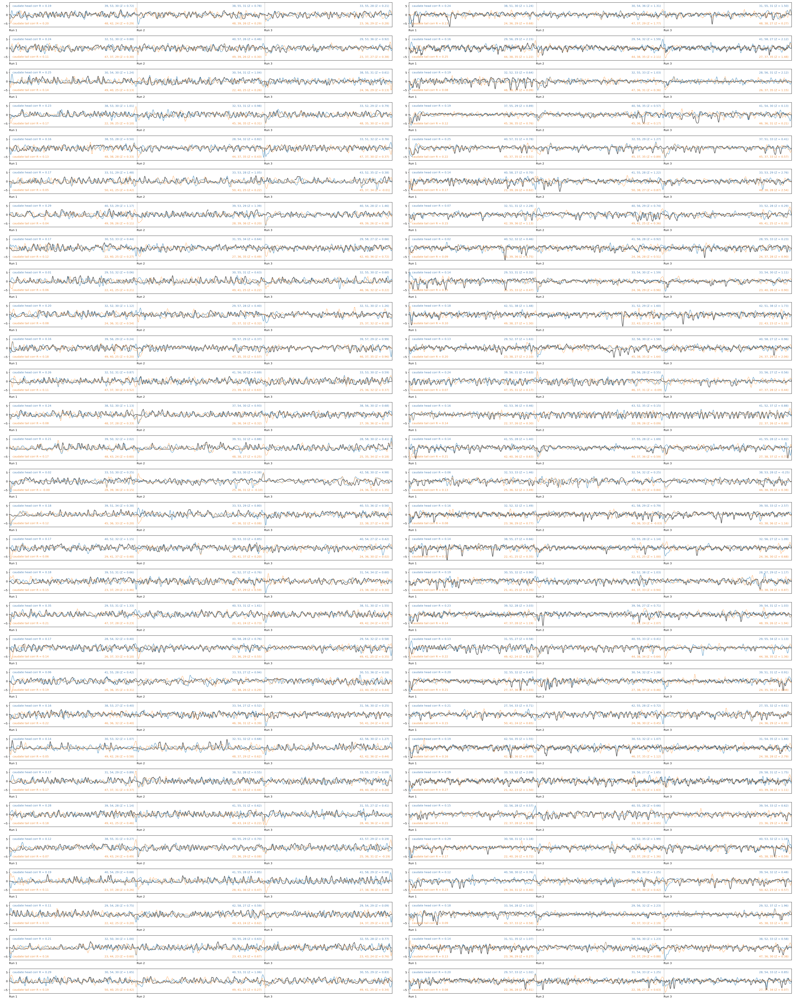

In [82]:
fig, ax = plt.subplots(30, 2, figsize=(40, 50))
runs = [1, 2, 3]

for i, subj in enumerate(ga_subj_list):
    for stage in [0, 1]:
        if stage == 1:
            subj_ = subj.replace('A', 'B')
        else:
            subj_ = subj
        
        _, cdh_signal, _, cdt_signal, rwd = results[subj_, 'Trained']

        ax[i, stage].plot(np.arange(1096*3), rwd, 'k-', label='success rate', linewidth=2, color='#666666')
        ax[i, stage].plot(np.arange(1096*3), cdh_signal, '-', label='caudate head', linewidth=1)
        ax[i, stage].plot(np.arange(1096*3), cdt_signal, '--', label='caudate tail', linewidth=1)

        ax[i, stage].set_xlim(0, 1096*3)
        ax[i, stage].set_ylim(-7, 7)
        ax[i, stage].plot((1096, 1096), (-7, 7), 'k-', alpha=0.2)
        ax[i, stage].plot((1096*2, 1096*2), (-7, 7), 'k-', alpha=0.2)

        ax[i, stage].set_xticks([0, 1096, 1096*2])
        ax[i, stage].set_xticklabels(['        Run %d' % r for r in runs])

        _, _, loc_head, val_head, _, _, loc_tail, val_tail = results[subj_, 'Trained', runs[0]]
        
        ax[i, stage].text(1096-280, 5, 
                            '%d, %d, %d (Z = %.2f)' % (*loc_head, val_head),
                            va='center', color='#4A81B6')
        ax[i, stage].text(1096-280, -5, 
                            '%d, %d, %d (Z = %.2f)' % (*loc_tail, val_tail),
                            va='center', color='#EF9140')
        
        _, _, loc_head, val_head, _, _, loc_tail, val_tail = results[subj_, 'Trained', runs[1]]
        
        ax[i, stage].text(1096*2-280, 5, 
                            '%d, %d, %d (Z = %.2f)' % (*loc_head, val_head),
                            va='center', color='#4A81B6')
        ax[i, stage].text(1096*2-280, -5, 
                            '%d, %d, %d (Z = %.2f)' % (*loc_tail, val_tail),
                            va='center', color='#EF9140')
        
        _, _, loc_head, val_head, _, _, loc_tail, val_tail = results[subj_, 'Trained', runs[2]]
        
        ax[i, stage].text(1096*3-280, 5, 
                            '%d, %d, %d (Z = %.2f)' % (*loc_head, val_head),
                            va='center', color='#4A81B6')
        ax[i, stage].text(1096*3-280, -5, 
                            '%d, %d, %d (Z = %.2f)' % (*loc_tail, val_tail),
                            va='center', color='#EF9140')
        
        df = pd.DataFrame(np.array([cdh_signal, cdt_signal, rwd.reshape(-1)]).T, 
                          columns=['head', 'tail', 'success rate'])

        head_corr = df.corr(method='pearson')['head']['success rate']
        tail_corr = df.corr(method='pearson')['tail']['success rate']
        
        ax[i, stage].text(25, 5, 
                            'caudate head corr R = %.2f' % (head_corr),
                            va='center', color='#4A81B6')
        ax[i, stage].text(25, -5, 
                            'caudate tail corr R = %.2f' % (tail_corr),
                            va='center', color='#EF9140')
        
fig.tight_layout()

In [91]:
runs = [1, 2, 3]

for i, subj in enumerate(subj_list):
        
    min_cdh_signal, max_cdh_signal, min_cdt_signal, max_cdt_signal, rwd = results[subj, 'Trained']

    df = pd.DataFrame(np.array([min_cdh_signal, max_cdh_signal, min_cdt_signal, max_cdt_signal, rwd.reshape(-1)]).T, 
                      columns=['min_head', 'max_head', 'min_tail', 'max_tail', 'success rate'])

    corr_matrix = df.corr(method='pearson')

    print('%s  %5.2f  %5.2f  %5.2f  %5.2f' % (subj, 
          corr_matrix['min_head']['success rate'],
          corr_matrix['max_head']['success rate'],
          corr_matrix['min_tail']['success rate'],
          corr_matrix['max_tail']['success rate'],
         ))

GA01  -0.24   0.19  -0.13   0.20
GA02  -0.08   0.24  -0.10   0.11
GA05  -0.17   0.25  -0.23   0.14
GA07  -0.07   0.23  -0.10   0.17
GA08  -0.22   0.16  -0.10   0.13
GA11  -0.04   0.17  -0.02   0.05
GA12  -0.12   0.29  -0.16   0.04
GA13  -0.20   0.17  -0.07   0.12
GA14  -0.24   0.01  -0.18   0.06
GA15  -0.11   0.20  -0.17   0.08
GA18  -0.14   0.16  -0.03   0.18
GA19  -0.10   0.26  -0.10   0.11
GA20  -0.10   0.24  -0.17   0.08
GA21  -0.18   0.21  -0.19   0.17
GA23  -0.07   0.02  -0.10  -0.00
GA26  -0.08   0.18  -0.01   0.12
GA27  -0.24   0.17  -0.21   0.06
GA28  -0.12   0.18  -0.06   0.15
GA29   0.02   0.35  -0.10   0.21
GA30  -0.12   0.17  -0.05   0.14
GA31  -0.14   0.06  -0.06   0.19
GA32  -0.24   0.16  -0.08   0.22
GA33  -0.12   0.14  -0.13   0.05
GA34  -0.10   0.17  -0.10   0.17
GA35  -0.12   0.28  -0.11   0.18
GA36  -0.22   0.12  -0.17   0.07
GA37  -0.08   0.19  -0.11   0.11
GA38  -0.16   0.11  -0.15   0.13
GA42  -0.12   0.21  -0.14   0.16
GA44  -0.09   0.29  -0.05   0.19
GB01  -0.0

In [92]:
runs = [4, 5, 6]

for i, subj in enumerate(subj_list):
        
    min_cdh_signal, max_cdh_signal, min_cdt_signal, max_cdt_signal, rwd = results[subj, 'Trained']

    df = pd.DataFrame(np.array([min_cdh_signal, max_cdh_signal, min_cdt_signal, max_cdt_signal, rwd.reshape(-1)]).T, 
                      columns=['min_head', 'max_head', 'min_tail', 'max_tail', 'success rate'])

    corr_matrix = df.corr(method='pearson')

    print('%s  %5.2f  %5.2f  %5.2f  %5.2f' % (subj, 
          corr_matrix['min_head']['success rate'],
          corr_matrix['max_head']['success rate'],
          corr_matrix['min_tail']['success rate'],
          corr_matrix['max_tail']['success rate'],
         ))

GA01  -0.24   0.19  -0.13   0.20
GA02  -0.08   0.24  -0.10   0.11
GA05  -0.17   0.25  -0.23   0.14
GA07  -0.07   0.23  -0.10   0.17
GA08  -0.22   0.16  -0.10   0.13
GA11  -0.04   0.17  -0.02   0.05
GA12  -0.12   0.29  -0.16   0.04
GA13  -0.20   0.17  -0.07   0.12
GA14  -0.24   0.01  -0.18   0.06
GA15  -0.11   0.20  -0.17   0.08
GA18  -0.14   0.16  -0.03   0.18
GA19  -0.10   0.26  -0.10   0.11
GA20  -0.10   0.24  -0.17   0.08
GA21  -0.18   0.21  -0.19   0.17
GA23  -0.07   0.02  -0.10  -0.00
GA26  -0.08   0.18  -0.01   0.12
GA27  -0.24   0.17  -0.21   0.06
GA28  -0.12   0.18  -0.06   0.15
GA29   0.02   0.35  -0.10   0.21
GA30  -0.12   0.17  -0.05   0.14
GA31  -0.14   0.06  -0.06   0.19
GA32  -0.24   0.16  -0.08   0.22
GA33  -0.12   0.14  -0.13   0.05
GA34  -0.10   0.17  -0.10   0.17
GA35  -0.12   0.28  -0.11   0.18
GA36  -0.22   0.12  -0.17   0.07
GA37  -0.08   0.19  -0.11   0.11
GA38  -0.16   0.11  -0.15   0.13
GA42  -0.12   0.21  -0.14   0.16
GA44  -0.09   0.29  -0.05   0.19
GB01  -0.0